<div id="container" style="position:relative;">
<div style="float:left"><h1> Forecasting Bakery Sales - Abi Magnall </h1></div>
<div style="position:relative; float:right"><img style="height:65px" src ="https://twomagpiesbakery.co.uk/wp-content/uploads/2020/11/logo-no-site.jpg" />
</div>
</div>

# Notebook 5 : Bakery Data EDA

The purpose of this EDA notebook is to explore and identify any anomalies and trends that exist in the data. Through this exploration the aim is to develop a hypothesis of independent variables that should be included in the modelling phase to accurately forecast the `Total_Revenue` and identify popular products to inform the business and determine a hypothesis for the [Market Basket Analysis](./11_Market_Basket_Analysis.ipynb).

- The identified trends could be general trends overtime, seasonal or against the independent variables selected of `Day`, `TAVG`, `PRCP`, `CPI_Electricity` and `CPI_Food`. 
- Full summary of the findings can be found below in [Summary of Analysis](#Summary-of-Analysis).

---

# Contents 

**[1. Part 1 : Initial EDA on Clean Datasets](#Part-1-:-Initial-EDA-on-Clean-Datasets)**

   - [Exploration into the `UnitPrice` Column](#Exploration-into-the-UnitPrice-Column)
   
   - [Exploration into the `Quantity` Column](#Exploration-into-the-Quantity-Column)
   
   - [Exploration into the Numerical Columns](#Exploration-into-the-Numerical-Columns)
   - [Exploration into the `Revenue` Change over Time](#Exploration-into-the-Revenue-Change-over-Time)
   - [Exploration into the Categorical Columns](#Exploration-into-the-Categorical-Columns)
   - [Analysis into Top and Bottom Selling Products for Each Shop](#Analysis-into-Top-and-Bottom-Selling-Products-for-Each-Shop)
    
**[2. Part 2 : EDA Revenue Against Independent Variables](#Part-2-:-EDA-Revenue-Against-Independent-Variables
)**

   - [Exploration of Revenue Against Independent Variables](#Exploration-of-Revenue-Against-Independent-Variables)
   - [Exploring the `Day` Against `Revenue`](#Exploring-the-Day-Against-Revenue)

**[3. Part 3 : EDA on Product Trends](#Part-3-:-EDA-on-Product-Trends)**

   - [Exploration into Product Sales Over Time](#Exploration-into-Product-Sales-Over-Time)
   - [Exploration of Product Sales Against Temperature](#Exploration-of-Product-Sales-Against-Temperature)
   - [Correlation Heat Map Between Products](#Correlation-Heat-Map-Between-Products)
   - [Exploration into Relationship with `Tea` and `Coffee` and Other Products](#Exploration-into-Relationship-with-Tea-and-Coffee-and-Other-Products)
    
**[Summary of Analysis](#Summary-of-Analysis)**

**[Next Steps](#Next-Steps)**

___

## Importing Libraries

In [57]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
from datetime import datetime
import time
import os
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
from plotly.graph_objs import *

## Importing Custom Functions

In [58]:
import BakeryFunctions as bakery

In [59]:
# To make figures better quality 
%matplotlib inline
%config InlineBackend.figuure_format = 'svg'
plt.style.use('seaborn')

/var/folders/fj/hxsz7nhs25b5xftsj_gmk99c0000gn/T/ipykernel_40434/1463811308.py:4: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



## Get Working Directory

In [60]:
working_directory = os.getcwd()
working_directory

'/Users/abimagnall/Documents/BrainStation/Capstone/Data/Abi_Magnall_Captsone_Project'

## Importing Preprocessed Dataset

In [61]:
aldeburgh = pd.read_csv(working_directory+'/3_preprocessed_data/aldeburgh_preprocessed.csv')
display(aldeburgh.head())
southwold = pd.read_csv(working_directory+'/3_preprocessed_data/southwold_preprocessed.csv')
display(southwold.head())
darsham = pd.read_csv(working_directory+'/3_preprocessed_data/darsham_preprocessed.csv')
display(darsham.head())
norwich = pd.read_csv(working_directory+'/3_preprocessed_data/norwich_preprocessed.csv')
display(norwich.head())
product_list = pd.read_csv(working_directory+'/2_clean_data/CleanProducts.csv', index_col=0)
display(product_list.head())

,TransactionId,ProductId,UnitPrice,Quantity,DiscountAmount,DiscountReasonId,RefundReasonId,Date,Revenue
0,325356083,21567882,3.2,1,0.00,0.0,0.0,2020-09-01,3.20
1,325399103,1677432,2.6,1,0.00,0.0,0.0,2020-09-01,2.60
2,325400582,20505962,4.5,1,2.25,13524.0,0.0,2020-09-01,2.25
3,325400582,15137944,1.8,1,0.00,0.0,0.0,2020-09-01,1.80
4,325403315,20405549,3.4,1,0.00,0.0,0.0,2020-09-01,3.40


,TransactionId,ProductId,UnitPrice,Quantity,DiscountAmount,DiscountReasonId,RefundReasonId,Date,Revenue
0,368108160,1677386,2.60,1,0.0,0.0,0.0,2021-07-01,2.60
1,368116614,1677402,2.85,1,0.0,0.0,0.0,2021-07-01,2.85
2,368121026,1677395,2.70,1,0.0,0.0,0.0,2021-07-01,2.70
3,368121026,9262077,2.40,1,0.0,0.0,0.0,2021-07-01,2.40
4,368121026,1677551,2.00,1,0.0,0.0,0.0,2021-07-01,2.00


,TransactionId,ProductId,UnitPrice,Quantity,DiscountAmount,DiscountReasonId,RefundReasonId,Date,Revenue
0,368107752,1677554,2.2,1,0.0,0.0,0.0,2021-07-01,2.2
1,368107752,1677387,2.9,1,0.0,0.0,0.0,2021-07-01,2.9
2,368107986,1677480,3.9,1,0.0,0.0,0.0,2021-07-01,3.9
3,368107986,7243504,2.5,1,0.0,0.0,0.0,2021-07-01,2.5
4,368107986,1677539,1.7,1,0.0,0.0,0.0,2021-07-01,1.7


,TransactionId,ProductId,UnitPrice,Quantity,DiscountAmount,DiscountReasonId,RefundReasonId,Date,Revenue
0,368106886,17865562,2.50,1,0.0,0.0,0.0,2021-07-01,2.50
1,368106886,1677415,2.30,1,0.0,0.0,0.0,2021-07-01,2.30
2,368106886,1677402,2.85,1,0.0,0.0,0.0,2021-07-01,2.85
3,368107620,1677426,2.90,1,0.0,0.0,0.0,2021-07-01,2.90
4,368107620,1677674,3.20,1,0.0,0.0,0.0,2021-07-01,3.20


,Name,ProductId
0,PORRIDGE T/O,1677377
1,PORRIDGE E/I,1677378
2,TOAST & JAM E/I,1677384
3,LATTE REG T/O,1677386
4,LATTE LARGE T/O,1677387


In [62]:
# Importing weather data
weather = pd.read_csv(working_directory+'/3_preprocessed_data/processed_weather.csv')
display(weather.head())

,Date,TAVG,PRCP
0,2020-09-01,24,0.00
1,2020-09-02,27,0.00
2,2020-09-03,31,0.07
3,2020-09-04,27,0.08
4,2020-09-05,23,0.01


In [63]:
# Importing CPI data
cpi = pd.read_csv(working_directory+'/3_preprocessed_data/cpi_processed_data.csv')
display(cpi.head())

,Date,"CPI INDEX 04.5 : ELECTRICITY, GAS AND OTHER FUELS 2015=100",CPI INDEX 01.1 : FOOD 2015=100
0,30/09/2020,107.6,102.8
1,31/10/2020,100.6,102.9
2,30/11/2020,100.5,102.9
3,31/12/2020,100.9,102.3
4,31/01/2021,101.1,102.8


In [64]:
# Renaming the cpi columns 
cpi.rename(columns={'CPI INDEX 04.5 : ELECTRICITY, GAS AND OTHER FUELS 2015=100':'CPI_Electricity',
                   'CPI INDEX 01.1 : FOOD 2015=100':'CPI_Food'}, inplace=True)

In [65]:
# Importing school holiday data
school_hols = pd.read_csv(working_directory+'/3_preprocessed_data/school_holidays.csv')
display(school_hols.head())

,School Holiday,Date
0,School Holiday,24/10/2020
1,School Holiday,25/10/2020
2,School Holiday,26/10/2020
3,School Holiday,27/10/2020
4,School Holiday,28/10/2020


In [66]:
shops_clean = [aldeburgh, southwold, norwich, darsham]

---

# Part 1 : Initial EDA on Clean Datasets

## Initial Analysis into Combined Shop Data
For the inital exploratory analysis, the four bakery datasets will be combined and summed to provide an overview of trends of quantity and products over time. This is done using to `pd.concat` method. A `ShopId` column will be added so exploration into trends in individual shops can occur. 

In [67]:
aldeburgh['ShopId'] = 'ALD'
southwold['ShopId'] = 'SW'
darsham['ShopId'] = 'DAR'
norwich['ShopId'] = 'NOR'

In [68]:
combined_shop_sales = pd.concat([aldeburgh,southwold,norwich,darsham])
combined_shop_sales

,TransactionId,ProductId,UnitPrice,Quantity,DiscountAmount,DiscountReasonId,RefundReasonId,Date,Revenue,ShopId
0,325356083,21567882,3.2,1,0.00,0.0,0.0,2020-09-01,3.20,ALD
1,325399103,1677432,2.6,1,0.00,0.0,0.0,2020-09-01,2.60,ALD
2,325400582,20505962,4.5,1,2.25,13524.0,0.0,2020-09-01,2.25,ALD
3,325400582,15137944,1.8,1,0.00,0.0,0.0,2020-09-01,1.80,ALD
4,325403315,20405549,3.4,1,0.00,0.0,0.0,2020-09-01,3.40,ALD
...,...,...,...,...,...,...,...,...,...,...
503245,467649692,1677522,11.0,1,0.00,0.0,0.0,2022-09-30,11.00,DAR
503246,467650555,8981483,2.3,1,1.15,13524.0,0.0,2022-09-30,1.15,DAR
503247,467650555,24670970,4.0,1,0.00,0.0,0.0,2022-09-30,4.00,DAR
503248,467650555,2971055,11.0,1,0.00,0.0,0.0,2022-09-30,11.00,DAR


## To Create Monthly Revenue for Each Shop

In [69]:
monthly_revenue = pd.DataFrame()
monthly_revenue['Date'] = combined_shop_sales['Date']
monthly_revenue['ALD_Revenue'] = aldeburgh['Revenue']
monthly_revenue['SW_Revenue'] = southwold['Revenue']
monthly_revenue['DAR_Revenue'] = darsham['Revenue']
monthly_revenue['NOR_Revenue'] = norwich['Revenue']
monthly_revenue.head()

,Date,ALD_Revenue,SW_Revenue,DAR_Revenue,NOR_Revenue
0,2020-09-01,3.20,2.60,2.2,2.50
1,2020-09-01,2.60,2.85,2.9,2.30
2,2020-09-01,2.25,2.70,3.9,2.85
3,2020-09-01,1.80,2.40,2.5,2.90
4,2020-09-01,3.40,2.00,1.7,3.20


In [70]:
monthly_revenue.set_index('Date', inplace=True)
monthly_revenue.index = pd.to_datetime(monthly_revenue.index)
monthly_revenue = monthly_revenue.resample('MS').sum()
monthly_revenue.head()

,ALD_Revenue,SW_Revenue,DAR_Revenue,NOR_Revenue
Date,,,,
2020-09-01,299763.98,309853.46,296409.60,122039.99
2020-10-01,292437.61,292518.19,290668.45,123751.93
2020-11-01,162756.56,159707.35,163240.32,70755.54
2020-12-01,189602.01,188400.59,189330.54,87037.59
2021-01-01,99848.17,101447.71,99989.02,43165.86


## Initial Overview of All Shop Data

In [71]:
bakery.further_eda(combined_shop_sales)

There are 10 columns and 1979121 rows 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1979121 entries, 0 to 503249
Data columns (total 10 columns):
 #   Column            Dtype  
---  ------            -----  
 0   TransactionId     int64  
 1   ProductId         int64  
 2   UnitPrice         float64
 3   Quantity          int64  
 4   DiscountAmount    float64
 5   DiscountReasonId  float64
 6   RefundReasonId    float64
 7   Date              object 
 8   Revenue           float64
 9   ShopId            object 
dtypes: float64(5), int64(3), object(2)
memory usage: 166.1+ MB


None


The number of missing values in each column are:


TransactionId       0
ProductId           0
UnitPrice           0
Quantity            0
DiscountAmount      0
DiscountReasonId    0
RefundReasonId      0
Date                0
Revenue             0
ShopId              0
dtype: int64


There are 0 duplicated rows of data in the dataset



,TransactionId,ProductId,UnitPrice,Quantity,DiscountAmount,DiscountReasonId,RefundReasonId,Revenue
count,1.979121e+06,1.979121e+06,1.979121e+06,1.979121e+06,1.979121e+06,1.979121e+06,1.979121e+06,1.979121e+06
mean,3.950637e+08,8.366646e+06,3.142459e+00,1.186533e+00,1.423006e-02,2.041457e+02,2.124288e+01,3.649284e+00
std,4.171940e+07,8.365563e+06,1.597793e+00,6.872595e-01,2.105897e-01,3.122491e+03,6.154839e+02,2.420860e+00
min,3.252873e+08,1.677377e+06,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,3.578232e+08,1.677452e+06,2.300000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.350000e+00
50%,3.917309e+08,1.677681e+06,2.800000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.000000e+00
75%,4.318960e+08,1.513794e+07,3.500000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.100000e+00
max,4.676506e+08,2.526304e+07,1.250000e+02,2.400000e+02,2.980000e+01,8.498100e+04,1.984900e+04,2.000000e+02


## Observations 
- There are 1,957,098 individual transactions in the dataset
- There are no missing or duplicated values
- All the columns are numerical except for the `Date` column
- The `Date` column is the incorrect datatype 
- There is a large distribution in `UnitPrice` from £0 - £125
- There are transactions with a `UnitPrice` of £0 that need further exploration into 
- The minimum `Quantity` is 0, this needs further exploration into to determine if that is an error or not
- `Revenue` ranges from £0-£200. The £0 transactions are most likely due ot products being refunded or where they've had a `UnitPrice` of £0 

First the `Date` column is converted to DateTime using the `convert_date` function. 

In [72]:
# To convert the date column to datetime
bakery.convert_date(combined_shop_sales)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1979121 entries, 0 to 503249
Data columns (total 10 columns):
 #   Column            Dtype         
---  ------            -----         
 0   TransactionId     int64         
 1   ProductId         int64         
 2   UnitPrice         float64       
 3   Quantity          int64         
 4   DiscountAmount    float64       
 5   DiscountReasonId  float64       
 6   RefundReasonId    float64       
 7   Date              datetime64[ns]
 8   Revenue           float64       
 9   ShopId            object        
dtypes: datetime64[ns](1), float64(5), int64(3), object(1)
memory usage: 166.1+ MB


None

---

## Exploration into the `UnitPrice` Column
In order to explore further into why some transactions have a unit price of zero, the shop table needs to be combined with the product list table to idetify what products have a unit price of zero. This is achieved by merging the shop and product table on the `ProductId` column using the `merge_data` function. 

In [73]:
combined_df = combined_shop_sales.copy()
combined_df = bakery.merge_dataset(combined_df,product_list, 'ProductId')

In [74]:
# A slice of the dataset is taken for transaction rows that have UnitPrice of zero
zero_price = combined_df[combined_df['UnitPrice']==0].copy()
zero_price

,TransactionId,ProductId,UnitPrice,Quantity,DiscountAmount,DiscountReasonId,RefundReasonId,Date,Revenue,ShopId,Name
134,325358593,15020093,0.0,1,0.0,0.0,0.0,2020-09-01,0.0,ALD,KITCHEN MESSAGE
3491,325962023,15020093,0.0,1,0.0,0.0,0.0,2020-09-04,0.0,ALD,KITCHEN MESSAGE
4173,326225515,15020093,0.0,1,0.0,0.0,0.0,2020-09-05,0.0,ALD,KITCHEN MESSAGE
4265,326257056,15020093,0.0,1,0.0,0.0,0.0,2020-09-05,0.0,ALD,KITCHEN MESSAGE
4328,326225978,15020093,0.0,1,0.0,0.0,0.0,2020-09-05,0.0,ALD,KITCHEN MESSAGE
...,...,...,...,...,...,...,...,...,...,...,...
1976472,466719885,23756437,0.0,1,0.0,0.0,0.0,2022-09-25,0.0,DAR,^^ TAP WATER JUG
1977088,466899154,23305524,0.0,2,0.0,0.0,0.0,2022-09-26,0.0,DAR,TAP WATER
1977418,467038659,23305524,0.0,1,0.0,0.0,0.0,2022-09-27,0.0,DAR,TAP WATER
1978295,467358397,23305524,0.0,2,0.0,0.0,0.0,2022-09-29,0.0,DAR,TAP WATER


In [75]:
zero_price['Name'].value_counts().head(20)

TAP WATER                    7319
^^ TAP WATER GLASS            401
^^ TAP WATER JUG              308
KITCHEN MESSAGE               154
OATLY REG COFFEE T/O          112
VEGANUARY OAT MILK OPTION      20
*Hot milk                      15
NORFOLK DAPPLE                  8
LATTE LARGE T/O                 6
FLAT WHITE REG T/O              5
green smoothie T/O              5
CARNE VAL E/I                   4
CROISSANT T/O                   4
CAPPUCCINO LARGE E/I            3
GRANOLA SLICE T/O               3
CAPPUCCINO LARGE T/O            3
CINNAMON SWIRLS T/O             3
LATTE REG T/O                   3
LATTE REG E/I                   3
CAPPUCCINO REG T/O              3
Name: Name, dtype: int64

### Observations 
- c.97% of the transactions with a unit price of zero are not actual sales but either notes to the kitchen, *KITCHEN MESSAGE*, or free products such as *Tap Water* or *Hot milk*,   therefore are not errors in the data
- The next products with the greatest number of transactions are *OATLY REG COFFEE T/O* and *VEGANUARY OAT MILK OPTION*. Speaking with the owner it was identified that this was a special promotion running through January and February where Oatly oat milk was free. Therefore, the unit price of zero is also correct
- The remainder of the products were identified to be entered incorrectly on the till system. As this only makes up 0.00015% of the entire dataset, they are considered to be statisitcally insignificant 

To not skew any insights derived from the remainder of the EDA or from the modelling phase, the transactions with a unit price of zero will be excluded. 

In [76]:
combined_clean = combined_df[combined_df['UnitPrice']!=0].copy()
combined_clean

,TransactionId,ProductId,UnitPrice,Quantity,DiscountAmount,DiscountReasonId,RefundReasonId,Date,Revenue,ShopId,Name
0,325356083,21567882,3.2,1,0.00,0.0,0.0,2020-09-01,3.20,ALD,BLUEBERRY & LEMON CAKE T/O
1,325399103,1677432,2.6,1,0.00,0.0,0.0,2020-09-01,2.60,ALD,FLAT WHITE REG E/I
2,325400582,20505962,4.5,1,2.25,13524.0,0.0,2020-09-01,2.25,ALD,SPELT & CHIA
3,325400582,15137944,1.8,1,0.00,0.0,0.0,2020-09-01,1.80,ALD,AMARETTI T/O
4,325403315,20405549,3.4,1,0.00,0.0,0.0,2020-09-01,3.40,ALD,TIRAMISU CAKE SLICE T/O
...,...,...,...,...,...,...,...,...,...,...,...
1979116,467649692,1677522,11.0,1,0.00,0.0,0.0,2022-09-30,11.00,DAR,DIABLO T/O
1979117,467650555,8981483,2.3,1,1.15,13524.0,0.0,2022-09-30,1.15,DAR,BAGUETTE
1979118,467650555,24670970,4.0,1,0.00,0.0,0.0,2022-09-30,4.00,DAR,CHOCOLATE POT DESSERT T/O
1979119,467650555,2971055,11.0,1,0.00,0.0,0.0,2022-09-30,11.00,DAR,THE GREEN MAN T/O


---

## Exploration into the `Quantity` Column 
It was also identified that some transactions had a `Quantity` of zero. Further exploration is required to determine if that is intentional (e.g. from a refunded or complementary item) or whether this is an error in the data. A copy of the the data will be taken to review this. 

In [77]:
zero_quantity = combined_clean[combined_clean['Quantity']==0].copy()
zero_quantity.head()

,TransactionId,ProductId,UnitPrice,Quantity,DiscountAmount,DiscountReasonId,RefundReasonId,Date,Revenue,ShopId,Name
7836,326872750,1677674,3.2,0,0.0,0.0,0.0,2020-09-08,0.0,ALD,SAUSAGE ROLL T/O
18551,329445218,1677449,2.1,0,0.0,0.0,0.0,2020-09-19,0.0,ALD,ENGLISH BREAKFAST TEA E/I
92295,344870106,20405577,3.2,0,0.0,0.0,19849.0,2021-01-04,0.0,ALD,DREAMY APPLE CAKE SLICE T/O
92296,344870106,20405549,3.4,0,0.0,0.0,19849.0,2021-01-04,0.0,ALD,TIRAMISU CAKE SLICE T/O
92301,344870106,21918560,3.9,0,0.0,0.0,0.0,2021-01-04,0.0,ALD,East Coast Rye


In [78]:
# To determine how many were refunds, if the RefundReasonId is greater than zero then it is classified as a refund
zero_quantity[zero_quantity['RefundReasonId']>0]

,TransactionId,ProductId,UnitPrice,Quantity,DiscountAmount,DiscountReasonId,RefundReasonId,Date,Revenue,ShopId,Name
92295,344870106,20405577,3.2,0,0.0,0.0,19849.0,2021-01-04,0.0,ALD,DREAMY APPLE CAKE SLICE T/O
92296,344870106,20405549,3.4,0,0.0,0.0,19849.0,2021-01-04,0.0,ALD,TIRAMISU CAKE SLICE T/O
92367,344870106,15137944,1.8,0,0.0,0.0,19849.0,2021-01-04,0.0,ALD,AMARETTI T/O
466699,428391187,1677680,2.5,0,0.0,0.0,11273.0,2022-04-08,0.0,ALD,CHEESE STRAW T/O
1477482,368458149,1677427,3.2,0,0.0,0.0,19849.0,2021-07-02,0.0,DAR,CAPPUCCINO LARGE E/I


### Observations 
- Five of these transactions were due to refunds, which can be seen by the populated `RefundReasonId` column
- Speaking to the owner, it was identified that the remainder of the transactions are due to products being added and then the quantity reduced to zero in an order, instead of the product being deleted from an order

As these do not affect the quantity of products being analysed and forecasted or the revenue (which will be calculated in the processing phase and equal zero due to the unit price being multipled by the quantity), these rows of data will not add anything to the model. Therefore, these rows will be removed in the procesing phase and for the remainder of the EDA. 

In [79]:
combined_clean = combined_clean[combined_clean['Quantity']!=0].copy()

---

# Exploration into the Numerical Columns
First the distribution of each column will be explored using histograms. 

In [80]:
combined_num = combined_clean.select_dtypes(['number','float']).copy()
combined_num.head()

,TransactionId,ProductId,UnitPrice,Quantity,DiscountAmount,DiscountReasonId,RefundReasonId,Revenue
0,325356083,21567882,3.2,1,0.00,0.0,0.0,3.20
1,325399103,1677432,2.6,1,0.00,0.0,0.0,2.60
2,325400582,20505962,4.5,1,2.25,13524.0,0.0,2.25
3,325400582,15137944,1.8,1,0.00,0.0,0.0,1.80
4,325403315,20405549,3.4,1,0.00,0.0,0.0,3.40


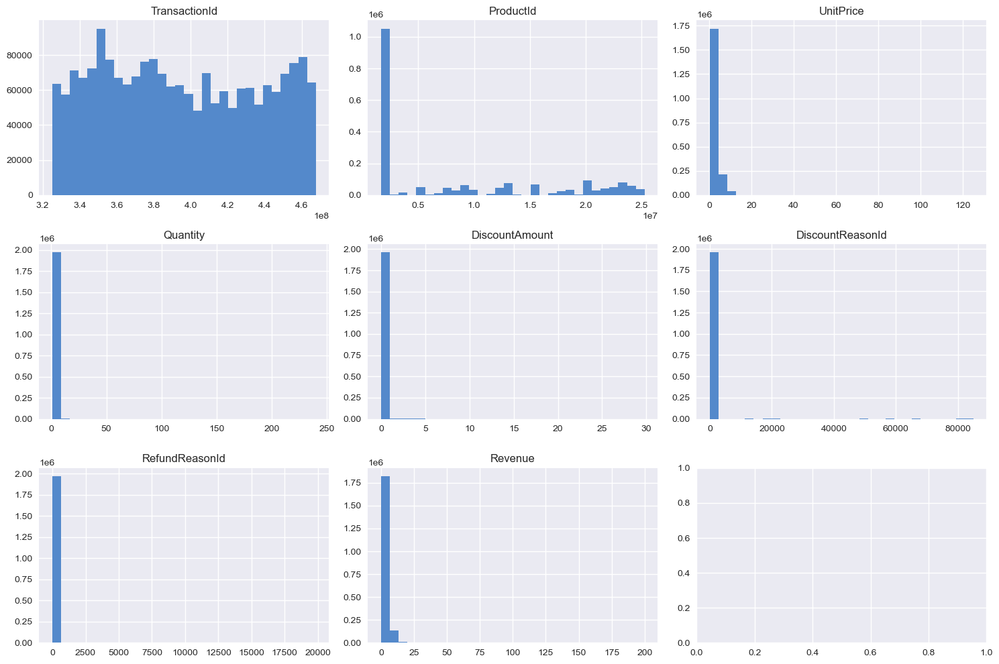

In [81]:
plt.subplots(3, 3, figsize=(15, 10))

count = 1

for col in combined_num.columns:
    plt.subplot(3, 3, count)
    plt.hist(combined_num[col], bins=30, color= bakery.light_magpie)
    plt.title(col)
    
    count += 1
    
plt.tight_layout()
plt.show()

### Observations 
- There is a range of `ProductId` that appears far more in the dataset than the rest (ID < 500,000)
- The majority of the procuts have a `UnitPrice` under £10
- Most transactions involve purchasing a `Quantity` less than 5 of any one product 
- The majority of transactions have a `DiscountAmount` are below £5 
- `Revenue` per transaction is mostly under £25 

---

# Exploration into the `Revenue` Change over Time
As one of the models being developed is forecasting product quantities, this column will be reviewed further to identify trends, any seasonal trends or relationships with external datasets such as weather and CPI data. An initial hypothesis about the trends can then be developed and tested in the modelling phase.  

To assess this, the weather and CPI data needs to merged with the `combined_clean` dataset, with the `Date` column set to DateTime and indexed. 

In [82]:
bakery.convert_date(combined_clean)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1970433 entries, 0 to 1979120
Data columns (total 11 columns):
 #   Column            Dtype         
---  ------            -----         
 0   TransactionId     int64         
 1   ProductId         int64         
 2   UnitPrice         float64       
 3   Quantity          int64         
 4   DiscountAmount    float64       
 5   DiscountReasonId  float64       
 6   RefundReasonId    float64       
 7   Date              datetime64[ns]
 8   Revenue           float64       
 9   ShopId            object        
 10  Name              object        
dtypes: datetime64[ns](1), float64(5), int64(3), object(2)
memory usage: 180.4+ MB


None

## Monthly Total Revenue Over Time
To assess the general trend of revenue over time, the sum of the monthly revenue will be plotted to see how it has changed over the last 2 years. A copy of the data is made a stored to `combined_monthly`, which will have the data resampled to be on a monthly basis. 

In [83]:
combined_monthly = combined_clean.copy()
combined_monthly = combined_monthly.set_index('Date').copy()

# Resampling the index to be on a montly scale so the total revenue each month can be plotted
combined_monthly = combined_monthly.resample('MS').sum()

/var/folders/fj/hxsz7nhs25b5xftsj_gmk99c0000gn/T/ipykernel_40434/2605558293.py:5: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [84]:
combined_monthly.head()

,TransactionId,ProductId,UnitPrice,Quantity,DiscountAmount,DiscountReasonId,RefundReasonId,Revenue
Date,,,,,,,,
2020-09-01,27715142229526,679544960326,234578.69,99951,657.95,7695492.0,1945780.0,271314.93
2020-10-01,27248818093146,647722659727,231204.09,96243,719.27,8628691.0,1823196.0,267385.25
2020-11-01,16098819355127,365963142074,130365.50,53730,749.52,7225587.0,810718.0,143635.13
2020-12-01,18359892781822,447220948476,155432.88,60929,1225.48,9338337.0,1161045.0,172578.22
2021-01-01,10105858079323,201571696854,80424.05,32824,597.66,4641566.0,424866.0,88514.74


In [85]:
# add lines for each column
fig = px.line(combined_monthly, x=combined_monthly.index, y=combined_monthly['Revenue'])

# axis labels and title
fig.update_layout(
    yaxis_title='Revenue £', 
    title='There is an Upwards Trend in Total Monthly Revenue, with a Yearly Seasonal Cycle' 
)


# activate slider
fig.update_xaxes(rangeslider_visible=True)

fig.show()

*Image of the above plotly graph showing the total monthly revenue over the two years of data.*
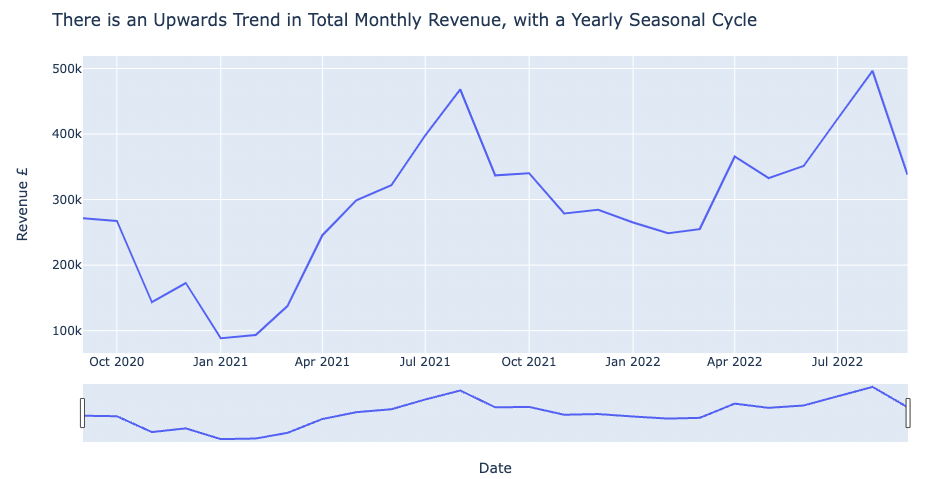

From the above graph there is a very clear upwards trend in revenue over the two years, and a distinct seasonal trend, with the peak revenue being in the summer months and dips in the winter months. To assess further, the total revenue per shop will be reviewed to see if this is the case for each shop. 

## Exploration of Total Monthly Revenue by Each Shop

In [86]:
# add lines for each column
fig = px.line(monthly_revenue, x=monthly_revenue.index, y=monthly_revenue.columns)

fig.update_layout(
    yaxis_title='Revenue £', 
    title='There is an Upwards Trend in Total Monthly Revenue for Most the Shops'#, plot_bgcolor='rgba(0,0,0,0)'
)

# activate slider
fig.update_xaxes(rangeslider_visible=True)

fig.show()

*Image of the above plotly graphs showing the monthly revenue over time for each bakery*
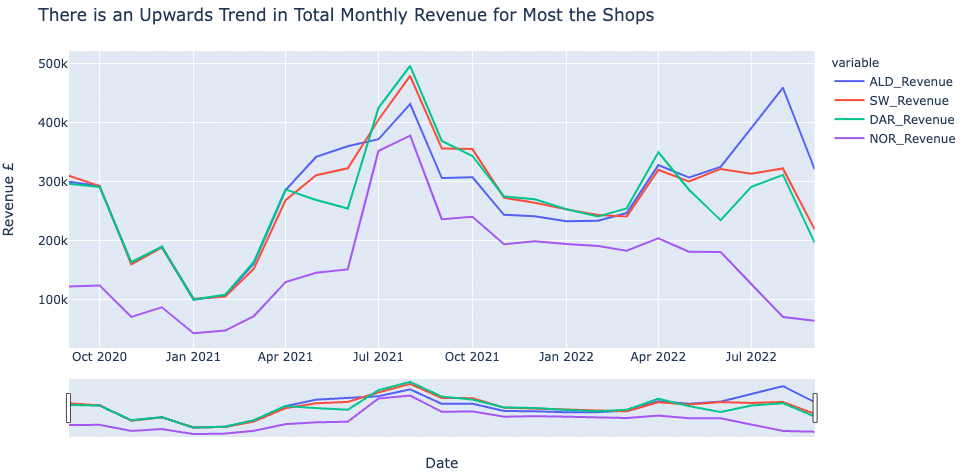

## Monthly Revenue Observations

From the above figure, again the general upwards trend of revenue over the two years can be seen, in particular for the bakeries `Aldeburgh`, `Darsham` and `Southwold`. However, the bakery `Norwich` has a weaker trend, which appears to start to decrease again for August and September 2022. This could be that `Norwich` has reached it's maximum capacity in reveue (due to cafe size or market size) and is no longer growing, so this is just the seasonal pattern. Or it could be that there is not enough data to see the full trend for this shop. To confirm this, more data is required to fully extrapolate the trend. 

For the bakeries: `Aldeburgh`, `Darsham` and `Southwold` the distinct seasonal trend is also seen. For `Norwich` the seasonal pattern is far weaker. On theory for this is that the locations of shops are different. `Aldeburgh`, `Darsham` and `Southwold` are all located near the seaside, whereas `Norwich` is located in a City, therefore the ones located by the seaside would have a greater seasonal pattern as people visit the beach at different times of the year, compared to a cafe in a City.

The growth from 2020-2021 compared to 2021-2022 seen appears to be much steaper. This is most likely due to the years 2020-2021 were post the Covid Pandemic and lockdown, therefore customers were going on more staycations (to the British seaside) and out as much as possible to cafes and restaurants as they couldn't during lockdowns. The following year more people were travelling abroad on holidays, inflation reached an all time high and it was the beginning of a cost of living crisis. Therefore, growth slowed down compared to the year before. For this modelling project the slowing in growth should not be too much of an issue. In the future when this is deployed, once all the bakeries plateau in growth and revenue a new model will need to be designed to account for this, however that isn't expected to be for a while as the bakery business plans to expand in the number of bakeries. 

---

# Exploration into the Categorical Columns
Next the categorical columns will be reviewed to identify any trends that could lead to insights and areas of exploration in the modelling. 

In [87]:
combined_cat = combined_clean.select_dtypes('object').copy()
combined_cat

,ShopId,Name
0,ALD,BLUEBERRY & LEMON CAKE T/O
1,ALD,FLAT WHITE REG E/I
2,ALD,SPELT & CHIA
3,ALD,AMARETTI T/O
4,ALD,TIRAMISU CAKE SLICE T/O
...,...,...
1979116,DAR,DIABLO T/O
1979117,DAR,BAGUETTE
1979118,DAR,CHOCOLATE POT DESSERT T/O
1979119,DAR,THE GREEN MAN T/O


To determine what are the top and bottom 10 selling products overall, the `top_bottom_products` function in usedm which counts the number of transactions per product and returns the top 10 and bottom 10 selling. 

In [88]:
bakery.top_bottom_products(combined_cat, 'all shops')

The top 10 selling products at all shops are: 
SAUSAGE ROLL T/O          76878
FLAT WHITE REG T/O        61917
MAGPIE SOURDOUGH LARGE    56736
CINNAMON SWIRLS T/O       45060
LATTE LARGE T/O           44488
CUSTARD TART T/O          38280
CHEESE STRAW T/O          36704
BAKEWELL T/O              36576
CROISSANT T/O             35245
AMARETTI T/O              33781
Name: Name, dtype: int64

The bottom 10 selling products at all shops are: 
BREAD & BUTTER              1
^^CHAI LATTE LRG            1
TIRAMISU 10"                1
^^ RADISH SALAD             1
ALLPRESS PUD DESSERT E/I    1
VEGAN CELERIAC PIZZA T/O    1
GINGER LOAF T/O             1
^^ HOUSE WHITE 175ML        1
^^ MOCHA REG                1
BLACK MAGIC 10"             1
Name: Name, dtype: int64


### Observations
- The top 10 selling products are all Take Out products 
    > - This could be due to the data starting in September 2020, which is only recently post the Covid pandemic and only 3 months after being allowed to eat in cafes again, which could be skewing the results as customers were not as comfortable to sit in cafes 
    > - Another hypothesis 3 our of the 4 bakeries in the dataset are located by the beach, perhaps customers prefer buying their products and eating them on the beach
    > - Further anaylysis into Eat In vs Take Out would be required to determine the reason. However, for this project the focus is on prediciting total sales, regardless on whether they are Eat In or Take Out, this will not be explored in depth for this analysis
- The majority of the top 10 selling prodcuts are products that have been selected for the forecasting model as they are the most difficult to predict. This emphasises the importance and necessity for an accurate forecast as they are the most in demand products, therefore sales and hence revenue could be lost if the forecast is incorrect
- The bottom 10 selling products appear to be either seasonal or retail products (whole cakes) and therefore are likely to have lower sales 

---

# Analysis into Top and Bottom Selling Products for Each Shop
To confirm the correct top products have been selected for forecasting the top and bottom 10 products will be identified for each shop to ensure that it is not one shop with a larger number of sales skewing the results. 

In [89]:
aldeburgh_clean = combined_clean[combined_clean['ShopId']=='ALD']
southwold_clean = combined_clean[combined_clean['ShopId']=='SW']
darsham_clean = combined_clean[combined_clean['ShopId']=='DAR']
norwich_clean = combined_clean[combined_clean['ShopId']=='NOR']

In [90]:
bakery.top_bottom_products(aldeburgh_clean, 'Aldeburgh')
print('')
bakery.top_bottom_products(southwold_clean, 'Southwold')
print('')
bakery.top_bottom_products(darsham_clean, 'Darsham')
print('')
bakery.top_bottom_products(norwich_clean, 'Norwich')

The top 10 selling products at Aldeburgh are: 
SAUSAGE ROLL T/O          24177
FLAT WHITE REG T/O        23320
MAGPIE SOURDOUGH LARGE    17087
CINNAMON SWIRLS T/O       14388
LATTE LARGE T/O           12573
CROISSANT T/O             12262
CUSTARD TART T/O          11977
LATTE REG T/O             11855
BAKEWELL T/O              11778
AMARETTI T/O              10870
Name: Name, dtype: int64

The bottom 10 selling products at Aldeburgh are: 
VIRGIN BLOODY MARY             1
CHOCOLATE SWIRL T/O            1
SAUSAGE ROLL X 4 MULTI         1
Mango & Lime Cake Slice T/O    1
BUMBLE ZEST CAN T/O            1
^^ CARTON BERRY                1
^^ VEGGIE BOARD                1
^^ MEAT BOARD                  1
TENDERSTEAM SALAD T/O          1
Tiger prawn brioche            1
Name: Name, dtype: int64

The top 10 selling products at Southwold are: 
SAUSAGE ROLL T/O          25238
FLAT WHITE REG T/O        20836
MAGPIE SOURDOUGH LARGE    18626
CINNAMON SWIRLS T/O       15978
LATTE LARGE T/O           

### Observations
- The top 10 selling products for `Aldeburgh`, `Southwold` and `Darsham` are all Take Out products 
    > - As these three bakeries are located by the seaside, this strengthens the hypothesis that customers are purchasing take away products to enjoy on the beach 
- `Norwich` has the majority of the top 10 selling products as Eat In. This is most likely due to it being located in a City, therefore people prefer to sit down and have a coffee inside than taking it away 
- The majority of the top 10 selling prodcuts across all the shops are products that have been selected for the forecasting model, validating that they have been selected correctly to forecast
- The bottom 10 selling products across all shops appear to be either seasonal or retail products (whole cakes) and therefore are likely to have lower sales 
- All shops seem appear to have the same product preferences so can be assumed to have similar customers with similar demands. 

---

# Part 2 : EDA Revenue Against Independent Variables
The focus of this project is in forecasting `Total_Revenue` of the combined bakery shops over time. Therefore, in addition to the trends and seasonal cycles in the data, trends and correlation between the `Total_Revenue` and external datasets need to be identified to support the modelling phase. To achieve this, the following steps are taken: 

- Exploration of Revenue Against `TAVG`, `PRCP`, `CPI_Electricity` and `CPI_Food` 
- Exploring the `Day` Against `Revenue`

As it appears from the inital EDA that all the shops behave quite similarly (they have the same seasonal and upwards trend, and the majority of the same top and bottom selling products) for the remainder of the EDA the total quantity and total revenue will be explored, using the processed datasets.

*Please refer back to [Bakery Data Preprocessing Notebook](./4_Bakery_Data_Preprocessing.ipynb) for the steps taken in the preprocessing if required.*

## Importing Total Revenue Dataset

In [91]:
total_rev = pd.read_csv(working_directory+'/5_timeseries_data/total_revenue.csv', index_col=0)
total_rev.index = pd.to_datetime(total_rev.index)
display(total_rev.head())

,Total_Revenue,Day,TAVG,PRCP,CPI_Electricity,CPI_Food
2020-09-01,9780.76,Weekday,24.0,0.00,107.6,102.8
2020-09-02,10037.55,Weekday,27.0,0.00,107.6,102.8
2020-09-03,9419.30,Weekday,31.0,0.07,107.6,102.8
2020-09-04,10606.15,Weekday,27.0,0.08,107.6,102.8
2020-09-05,12922.00,Weekend,23.0,0.01,107.6,102.8


In [92]:
total_rev_encoded = pd.read_csv(working_directory+'/5_timeseries_data/total_revenue_encoded.csv', index_col=0)
total_rev_encoded.index = pd.to_datetime(total_rev_encoded.index)
display(total_rev_encoded.head())

,Total_Revenue,TAVG,PRCP,CPI_Electricity,CPI_Food,Bank_Holiday,Closed_Xmas,School_Holiday,Weekday,Weekend
2020-09-01,9780.76,24.0,0.00,107.6,102.8,0,0,0,1,0
2020-09-02,10037.55,27.0,0.00,107.6,102.8,0,0,0,1,0
2020-09-03,9419.30,31.0,0.07,107.6,102.8,0,0,0,1,0
2020-09-04,10606.15,27.0,0.08,107.6,102.8,0,0,0,1,0
2020-09-05,12922.00,23.0,0.01,107.6,102.8,0,0,0,0,1


---

# Exploration of `Revenue` Against Independent Variables 
To try and determine which independent variables would be good predictors for forecasting `Revenue`, their correlation and trends with `Revenue` will be explored. 

First to get an initial understanding on whether there is a trend, a `regplot` for each independent variable against `Total_Revenue` will be plotted. 

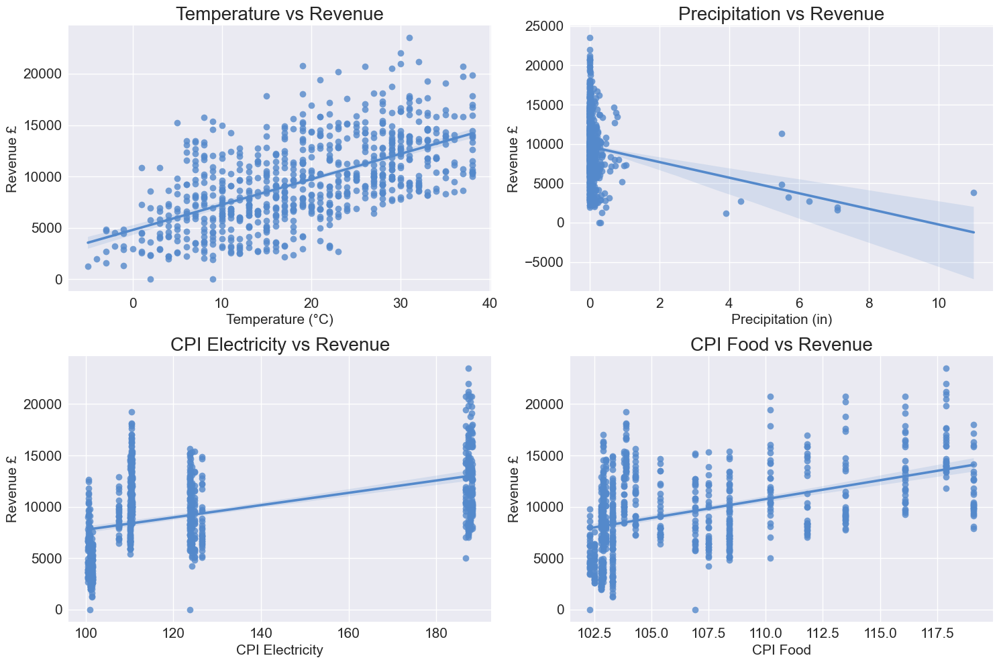

In [93]:
# To plot four regplots, one for each idependent variable against revenue
plt.subplots(2,2, figsize=(15,10))

# Plots average temperature against revenue
plt.subplot(2,2,1)
bakery.plot_regplot(total_rev, 'Total_Revenue', 'TAVG','Temperature vs Revenue', 'Revenue £', 'Temperature (°C)')

# Plots average precipitation against revenue
plt.subplot(2,2,2)
bakery.plot_regplot(total_rev, 'Total_Revenue', 'PRCP','Precipitation vs Revenue', 'Revenue £', 'Precipitation (in)')

# Plots average CPI_Electricity against revenue
plt.subplot(2,2,3)
bakery.plot_regplot(total_rev, 'Total_Revenue', 'CPI_Electricity','CPI Electricity vs Revenue',
             'Revenue £', 'CPI Electricity')

# Plots average CPI_Food against revenue
plt.subplot(2,2,4)
bakery.plot_regplot(total_rev, 'Total_Revenue', 'CPI_Food','CPI Food vs Revenue', 'Revenue £', 'CPI Food')
# To makes sure there is no overlap in plots

plt.tight_layout()  

plt.show()

### Regplot Observations
- There is a strong positive correlation between temperature and revnue
- There is a weak negative correlation between precipitation and revenue 
- There is a weak positive correaltion between CPI electricity and revenue 
- There is a positive correlation between CPI food and revenue 

To further understand these correlations and quantify them, a heat map of the pearsons correlation between revenue and each independent variable is plotted. 

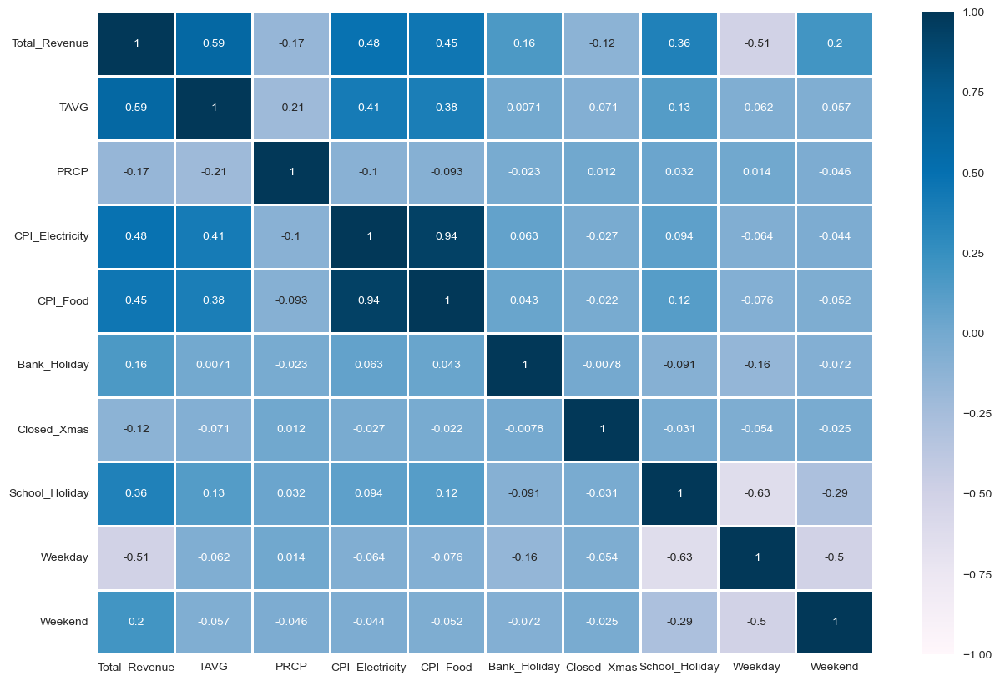

In [94]:
plt.figure(figsize=(15,10))
sns.heatmap(total_rev_encoded.corr(),
            cmap='PuBu',vmin=-1, vmax=1, annot=True, lw=1, annot_kws={'size': 10})
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

### Heatmap Observations
- The strongest correlation with total revenue is the average temperature, `TAVG`. This seems reasonable as it is known that most the bakeries are located by the seaside and people generally prefer going to the seaside when the weather is warmer 
- `CPI_Electricity` and `CPI_Food` have a reasonable correlation with the total revenue. However, they are extremely correlated to each other, therefore one of the variables would have to be excluded from any modelling to reduce multicollinearity
- Precipitation has little to no correlation with the total revenue, therefore it is unlikely that revenue is dependent on precipitation levels
- The different day types having varying correlations with total revenue. `Weekday`

To further explore the relationship, line graphs will be plotted to show the change in revenue over time against each of these independent variables. For this the index will be resampled to show the sum of the monthly revenue against average temperature, precipitation and CPI values. For this the dataset has to be split into two so the revenue can be summed and the independent variables can have the mean calculated. These two dataframe will then be concatonated back together. 

In [95]:
total_rev_only = total_rev['Total_Revenue'].copy()
independent_variables = total_rev[['Day', 'TAVG', 'PRCP', 'CPI_Electricity', 'CPI_Food']].copy()

In [96]:
# To resample the revenue to show the sum of revenue for each month 
total_rev_only = total_rev_only.resample('MS').sum()
# to resample the independent variables to show the mean for each month
independent_variables = independent_variables.resample('MS').mean()

/var/folders/fj/hxsz7nhs25b5xftsj_gmk99c0000gn/T/ipykernel_40434/1563002933.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [97]:
total_rev_monthly = pd.concat([total_rev_only, independent_variables], axis=1)
total_rev_monthly.head()

,Total_Revenue,TAVG,PRCP,CPI_Electricity,CPI_Food
2020-09-01,271314.930000,26.300000,0.077667,107.6,102.8
2020-10-01,267385.250000,19.064516,0.142581,100.6,102.9
2020-11-01,143635.130000,15.533333,0.054000,100.5,102.9
2020-12-01,173145.725556,9.064516,0.144516,100.9,102.3
2021-01-01,95207.984444,5.290323,0.107742,101.1,102.8


In [98]:
bakery.plot_rev_lines(total_rev_monthly, 'TAVG', 'There is a Strong Correlation Between Revenue and Avg Temperature',
               'Average Temperature (°C)')

bakery.plot_rev_lines(total_rev_monthly, 'PRCP', 'There is a Weak Correlation Between Revenue and Precipitation',
               'Average Precipitation (in)')

bakery.plot_rev_lines(total_rev_monthly, 'CPI_Electricity',
               'There is Some Correlation Between Revenue and CPI Electricity', 'CPI Electricity')

bakery.plot_rev_lines(total_rev_monthly, 'CPI_Food',
               'There is Some Correlation Between Revenue and CPI Food', 'CPI Food')

*Figures of the above plotly graphs can be found below in case the notebook is not run.*
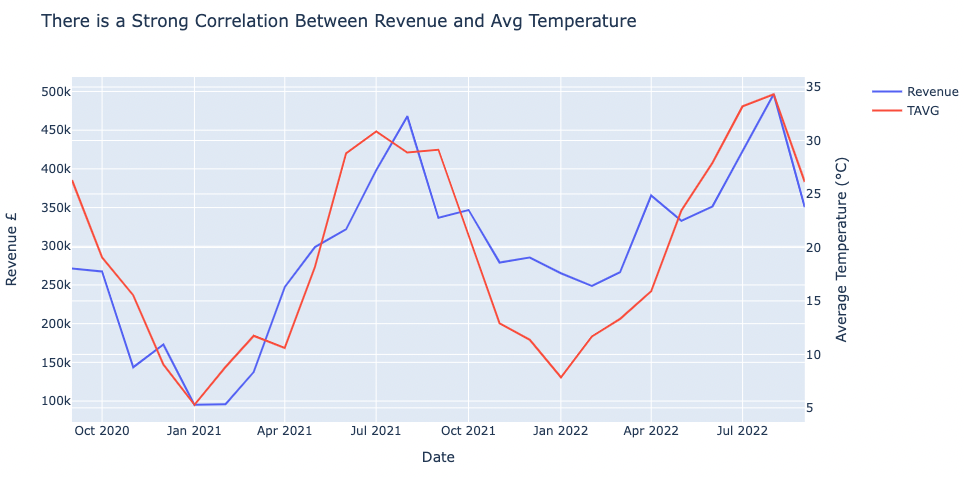

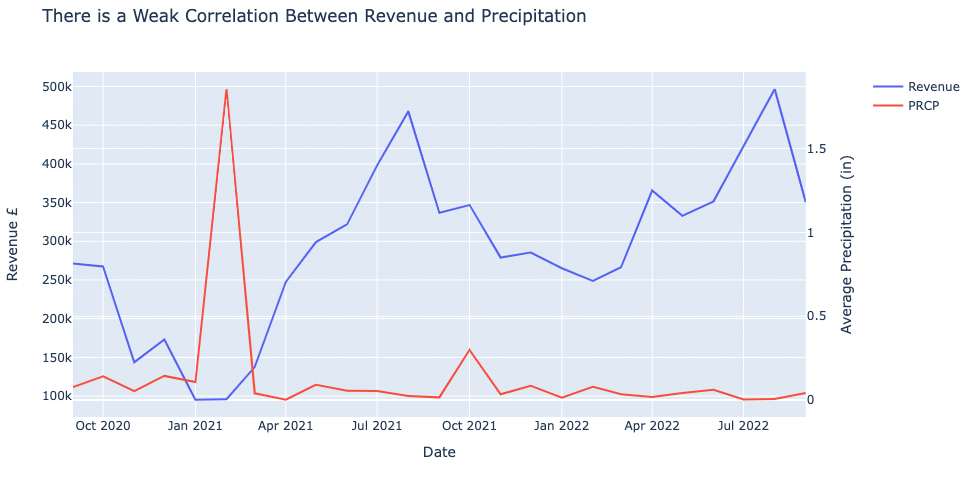

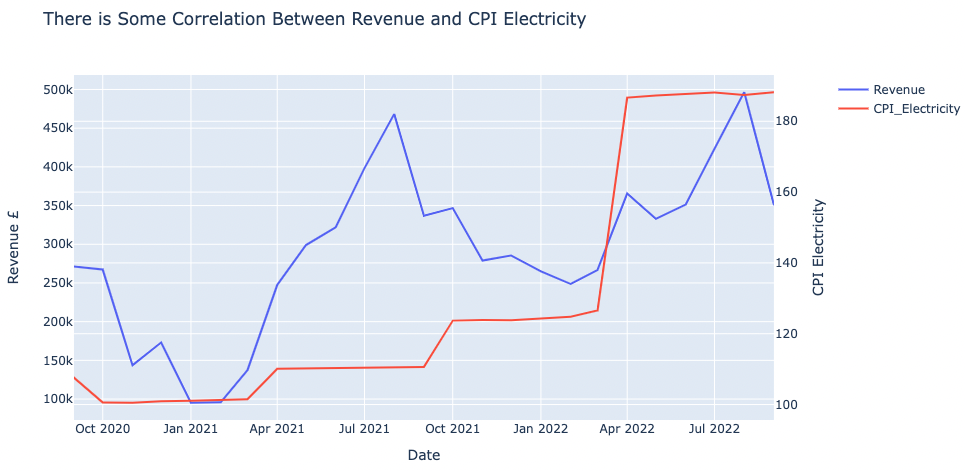

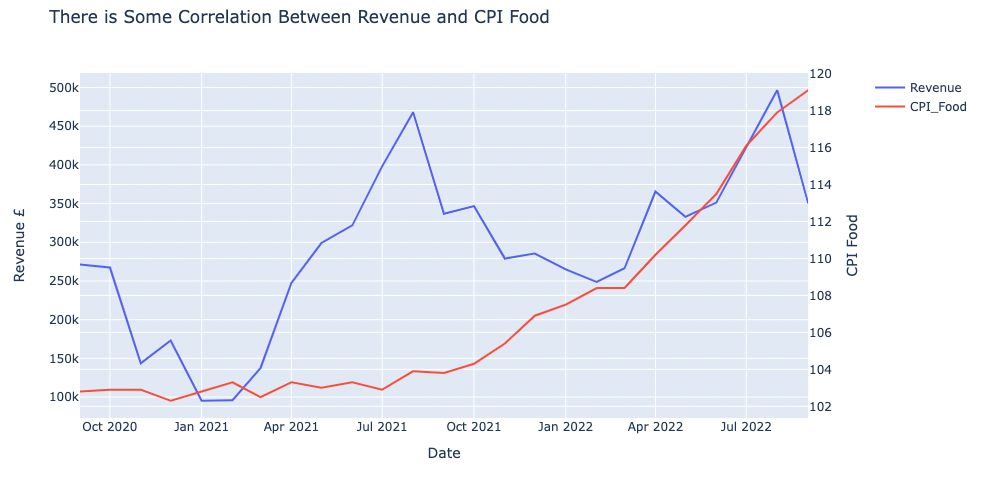

## Oberservations
- Temperature has the greatest correlation to total revenue, with the trend lines being practically on top of each other. This suggests that temperature could be a good predictor for total revenue forecasting.
- Precipitation has a weak correlation to total revenue, so would be a poor predictor of total revenue.
- Both CPI Electricity and CPI Food have a strong correlation to total revenue post January 2022, however are poorly correlated before then. 

Therefore, for the modelling phase of this project, the average daily temperature will be taken forward as an external variable to see if it is a good predictor for revenue forecasting. 

---

# Exploring the `Day` Against `Revenue`
To determine whether a model such as Prophet is required or whether ARIMA is sufficient, the type of day (e.g. weekday, weekend, bank holiday etc) will be plotted against the total revenue to determine if there is a correlation. 

First the average revenue will be determined for each `Day`, by taking a copy of the dataset called `special_dates_rev`. The data will then be grouped by the `Day` column and the mean taken. 

In [99]:
special_dates_rev = total_rev[['Day', 'Total_Revenue']].copy()
special_dates_rev = round(special_dates_rev.groupby('Day').mean(),2)
special_dates_rev.sort_values('Total_Revenue', ascending=False)

,Total_Revenue
Day,
Bank Holiday,13865.68
School Holiday,12045.26
Weekend,11284.08
Weekday,7554.44
Closed - Xmas,0.00


It is evident from the above table that `Bank Holiday` and `School Holiday` days bring in the most revenue on average compared to non-school holidays. In addition to this, it can be seen that `Weekend` days bring in more revenue than `Weekday` days. To further visualise this trend, the revenue by `Day` is plotted as a scatterplot below. 

In [100]:
# Plotting a scatter plot of total revenue over time with a different colour for each day type 
fig = px.scatter(total_rev, x=total_rev.index, y=total_rev['Total_Revenue'], color='Day')

# To add axis labels and title
fig.update_layout(
    yaxis_title='Revenue (£)', 
    xaxis_title = 'Date',
    legend_title='', 
    title='Daily Revenue by Day Type'#, plot_bgcolor='rgba(0,0,0,0)'
)
# fig.write_image('dayblank.png', scale=2)

# To sactivate slider
fig.update_xaxes(rangeslider_visible=True)

fig.show()

**Image of the Plotly Graph**
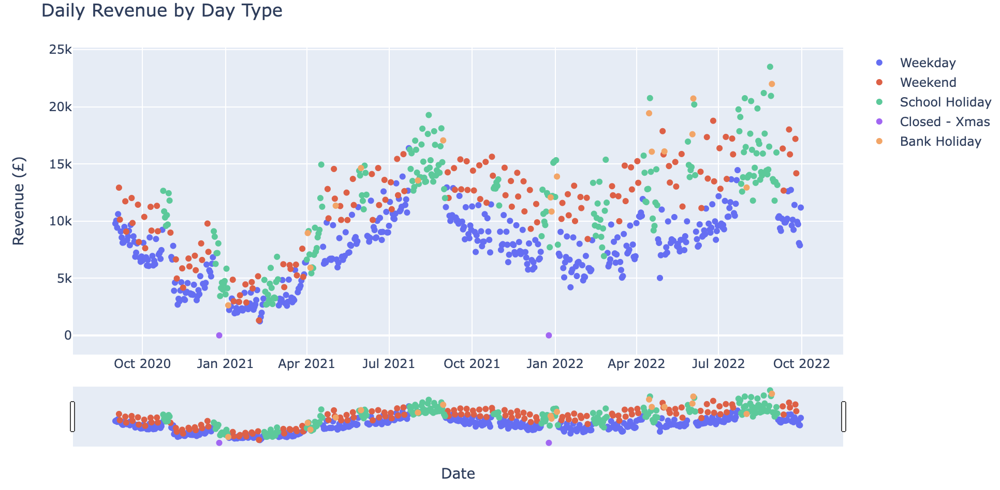

## Observations
From the above table showing the mean revenue for each `Day` type and the scatter plot, it is evident that the type of day has an affect on the `Total_Revenue` being made. It can be seen that `School Holidays` and `Bank Holidays` appear to generate greater revenue, and `Weekdays` generate the least revenue. This is supported from the correlation statistics in the heatmap, with `Weekday` being strongly negatively correlated with `Total_Revenue` and the other day types all being positively correlated. 

Therefore, it can be concluded that Facebook Prophet modelling could be a suitable option. 

---

# Part 3 : EDA on Product Trends 
The top products identified below were selected by the business as they are known to be the most in demand (validated above in the exploration into the category columns) and the most difficult to predict the number of sales. Therefore, understanding their sales overtime is essential. 

In addition to this, these products will be used in [Market Basket Analysis](./11_Market_Basket_Analysis.ipynb) to identify items frequently and more likley to be bought together, which can inform the business on promotions that can be made to increase revenue. 

The steps taken in this analysis are summarised in the below:
- Plot of each product sales over time 
- Plot of each product sales over time against `TAVG`
- Correlation heatmap plotted to develop a hypothesis on which products are likely sold together 
- Regplots of each product against `Tea` and `Coffee` to identify those that are strongly correlated and potentially bought together

These hypotheses can then be evaluated in the Market Basket Analysis. 

First an exploration into their sales over time will be assessed, to identify if there are any trends or seasonal patterns. 

## Importing Quantity Dataset

In [101]:
total_quantity = pd.read_csv(working_directory+'/4_processed_data/total_quantity_processed.csv', index_col=0)
total_quantity.index = pd.to_datetime(total_quantity.index)
display(total_quantity.head())

,Almond Toast,Baguette,Bakewell,Cheese & Tomato Melt,Cheese Scone,Cheese Straw,Cinnamon Swirl,Coffee,Croissant,Croque Monsieur,...,Magpie Sourdough,Moroccan Vegan Roll,Pain Au Chocolate,Sausage Roll,Tea,Day,TAVG,PRCP,CPI_Electricity,CPI_Food
2020-09-01,13.0,65.0,87.0,12.0,52.0,118.0,119.0,681.0,102.0,20.0,...,104.0,59.0,99.0,211.0,82.0,Weekday,24.0,0.00,107.6,102.8
2020-09-02,13.0,63.0,75.0,9.0,62.0,58.0,122.0,687.0,22.0,11.0,...,108.0,83.0,87.0,225.0,103.0,Weekday,27.0,0.00,107.6,102.8
2020-09-03,40.0,59.0,67.0,5.0,56.0,80.0,115.0,667.0,136.0,11.0,...,96.0,51.0,110.0,191.0,93.0,Weekday,31.0,0.07,107.6,102.8
2020-09-04,1.0,54.0,70.0,6.0,55.0,74.0,114.0,748.0,121.0,20.0,...,132.0,54.0,98.0,193.0,114.0,Weekday,27.0,0.08,107.6,102.8
2020-09-05,13.0,94.0,84.0,13.0,61.0,124.0,119.0,825.0,152.0,13.0,...,114.0,106.0,98.0,272.0,129.0,Weekend,23.0,0.01,107.6,102.8


In [102]:
# A new copy of the dataset is made with only the product columns 
product_df_daily = total_quantity.drop(columns=['Day', 'TAVG', 'PRCP', 'CPI_Electricity', 'CPI_Food']).copy()
product_df = product_df_daily.resample('MS').sum()

## Exploration into Product Sales Over Time
To understand whether there are seasonal trends to the product sales, the monthly quantity sold will be plotted against time for each product. 

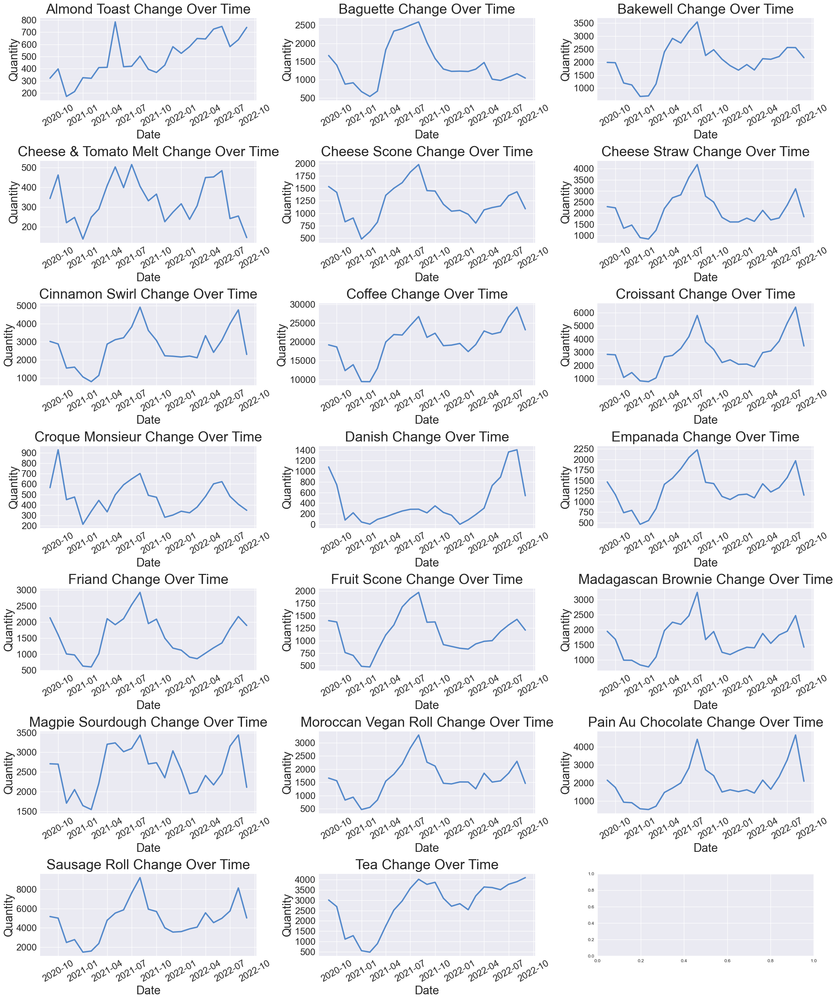

In [103]:
# Loop through column names and plot line plots for monthly sales over time for each product

plt.subplots(7,3, figsize=(25,30))

for i, product in enumerate(product_df.columns):
    plt.subplot(7,3,i+1)
    sns.lineplot(data = product_df, 
                 x=product_df.index, y=product_df[product], color = bakery.light_magpie, linewidth=3)
    
    plt.title(f'{product} Change Over Time', fontsize=30,pad=10)
    plt.ylabel('Quantity', fontsize=25)
    plt.xlabel('Date', fontsize=25)
    plt.yticks(fontsize=20)
    plt.xticks(fontsize=20, rotation=30)
    plt.tight_layout()
    
plt.show()

### Observations 
- The majority of the products show the same upward and seasonal trend as the overall revenue and quantity of sales 
- `Danish` and `Baguette` products appear to have a less similar pattern. Speaking with owner this is due to them not always being stocked as consistently as the demand is unknown 

As it is known that `TAVG` has a strong correlation with total sales, this will be plotted against the total sales of each product over time to see if the correlation is consistent for all products or certain ones. This will be important to determine for prior to the modelling phase, so it can be determined whether to be included or not for the forecasts of individual products. 

## Exploration of Product Sales Against Temperature 
From the above exploration, `TAVG` appeared to have the greatest correlation with revenue. Therefore, to identify if the trend is the same for products or only certain products, the monthly average temperature will be plotted against the product sales over time. 

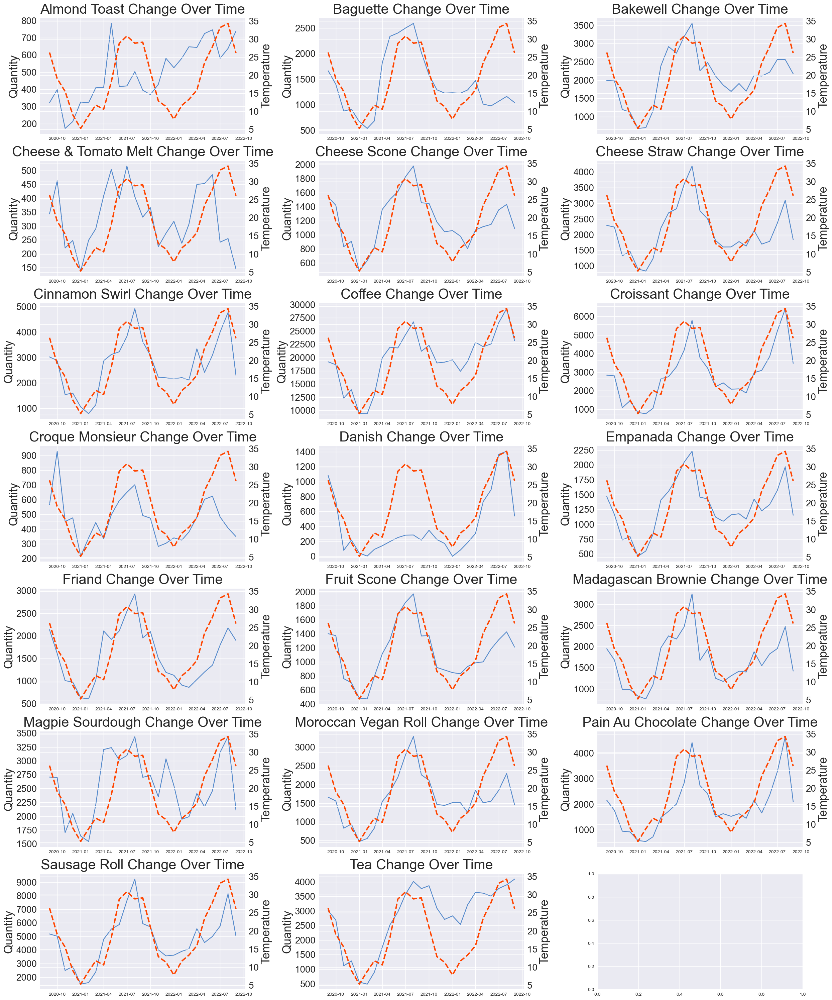

In [104]:
# Loop through column names and plot line plots for monthly sales over time for each product agaisnt TAVG
plt.subplots(7,3, figsize=(25,30))

for i, product in enumerate(product_df.columns):
    plt.subplot(7,3,i+1)
    sns.lineplot(data = product_df, 
                 x=product_df.index, y=product_df[product], color = bakery.light_magpie)
    plt.ylabel('Quantity', fontsize=25)
    plt.yticks(fontsize=20)
    
    ax2 = plt.twinx()
    sns.lineplot(data=total_rev_monthly, x = total_rev_monthly.index, y=total_rev_monthly['TAVG'], ax=ax2,
                color='orangered', linewidth=3, linestyle='--')
    
    plt.title(f'{product} Change Over Time', fontsize=30,pad=10)
    plt.ylabel('Temperature', fontsize=25)
    plt.xlabel('Date', fontsize=25)
    plt.yticks(fontsize=20)
    plt.xticks(fontsize=20, rotation=30)
    plt.tight_layout()
    
plt.show()

### Observations
- The majority of the products follow the same patter as the `TAVG` line, except for `Tea`, `Friands`, `Almond Toast`, `Danish` and `Cheese and Tomato Melt` products. Therefore, in the modelling phase `TAVG` may not be a useful predictor of total sales. 

## Correlation Heat Map Between Products
To validate this theory and the fact that `PRCP`, `CPI_Electricity` and `CPI_Food` are weaker indicators of individual product sales, a correlation matrix is plotted.

/var/folders/fj/hxsz7nhs25b5xftsj_gmk99c0000gn/T/ipykernel_40434/2774066047.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

/var/folders/fj/hxsz7nhs25b5xftsj_gmk99c0000gn/T/ipykernel_40434/2774066047.py:4: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



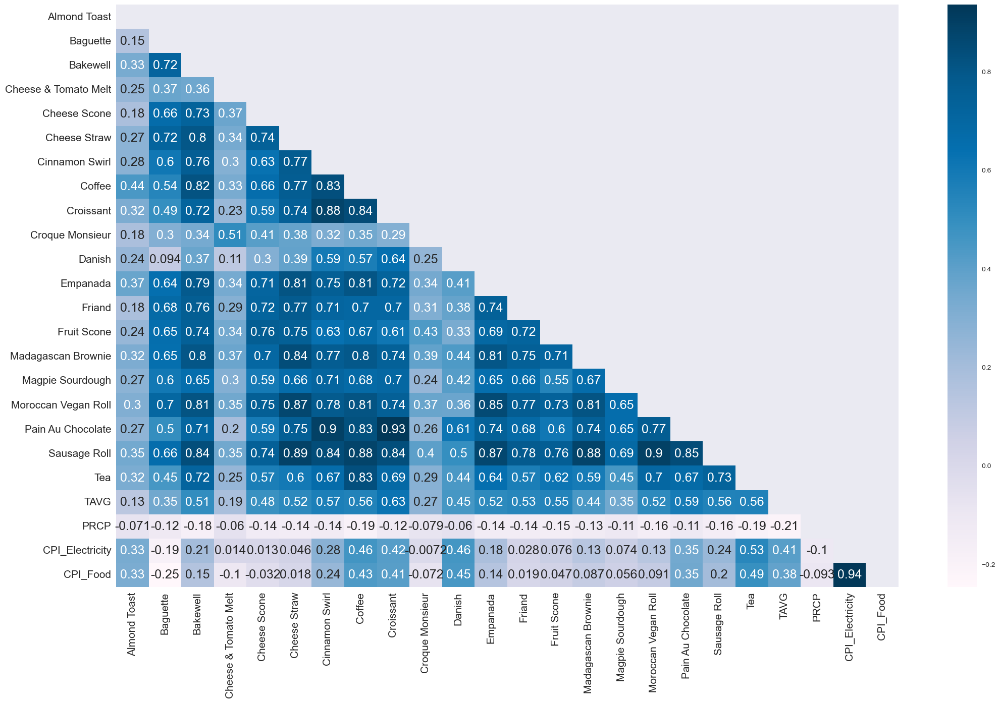

In [105]:
# plotting the correlation matrix using a heatmap 
corr = total_quantity.corr()
plt.figure(figsize=(25,15))
matrix = np.triu(total_quantity.corr())
sns.heatmap(corr, annot=True, mask=matrix, cmap='PuBu', annot_kws={'size': 18})
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

## Observations
- `PRCP`, `CPI_Electricity` and `CPI_Food` all have weak correlations with the individual products so are less likely to be good predictors of sales 
- `TAVG` has a relatively strong correlation with a about half of the products and a weak one with the other half. Therefore, `TAVG` should only be included in the models where it has a stronger correlation 
- `Coffee` is strong correlated with most of the products, suggesting they could be purchased together 
- `Tea` has a strong correlation to some of the products, such as `Bakewell`, `Sausage Roll`, `Moroccan Vegan Roll` and `Pain Au Chocolate` however it is a weaker correlation than `Coffee` with these products, suggesting `Coffee` is chosen in preference to `Tea`

---

# Exploration into Relationship with `Tea` and `Coffee` and Other Products
To identify which products correlate positively with `Tea` or `Coffee`, this will indicate which products are likely bought together and therefore create a hypothesis for the Market Basket Analysis, which can inform the business on promotional offers that could be implemented to increase revenue. 

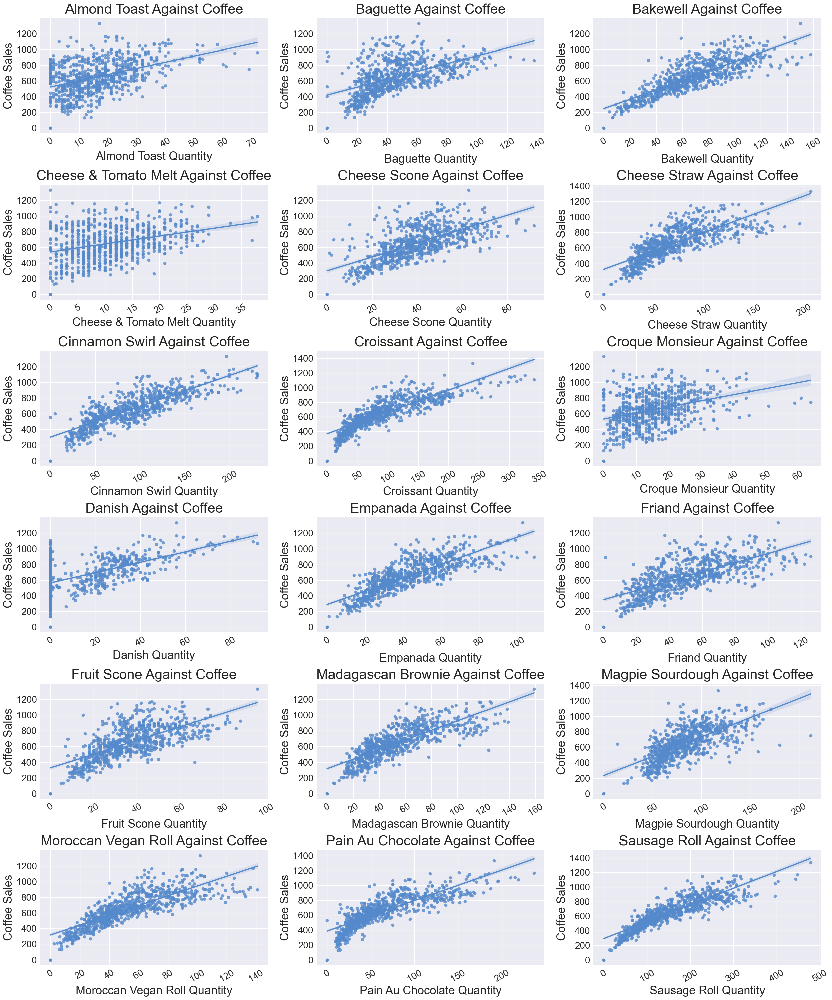

In [106]:
# Loop through product column names against coffee 
plt.subplots(6,3, figsize=(25,30))

for i, product in enumerate(product_df_daily.columns.drop(['Coffee', 'Tea'])):
    plt.subplot(6,3,i+1)
    sns.regplot(data = product_df_daily, 
                 x=product_df_daily[product], y=product_df_daily['Coffee'], color = bakery.light_magpie)
    plt.ylabel('Coffee Sales', fontsize=25)
    plt.yticks(fontsize=20)
    plt.title(f'{product} Against Coffee', fontsize=30,pad=10)
    plt.xlabel(f'{product} Quantity', fontsize=25)
    plt.xticks(fontsize=20, rotation=30)
    plt.tight_layout()
    
plt.show()

## Observations of `Coffee` Correlation with Other Products
From the above plots, it appears that all the products have a positive correlation with `Coffee` sales. However, this could be due to `Coffee` being the top selling product from the bakery. 

Of these products and regplots: 
- `Sausage Roll`, `Croissant`, `Bakewell`, `Cheese Straw` and `Pain Au Chocolate` all appear to have the greatest correlation with `Coffee` sales, suggesting they could be frequently bought together 
- `Danish`, `Cheese & Tomato Melt`, `Croque Monsieur` and `Almond Toast` all appear to have weaker correlations with `Coffee` suggesting they are more likely to be bought independently than with a `Coffee`

The same process will now be repeated to determine which products are likely bought with `Tea`. 

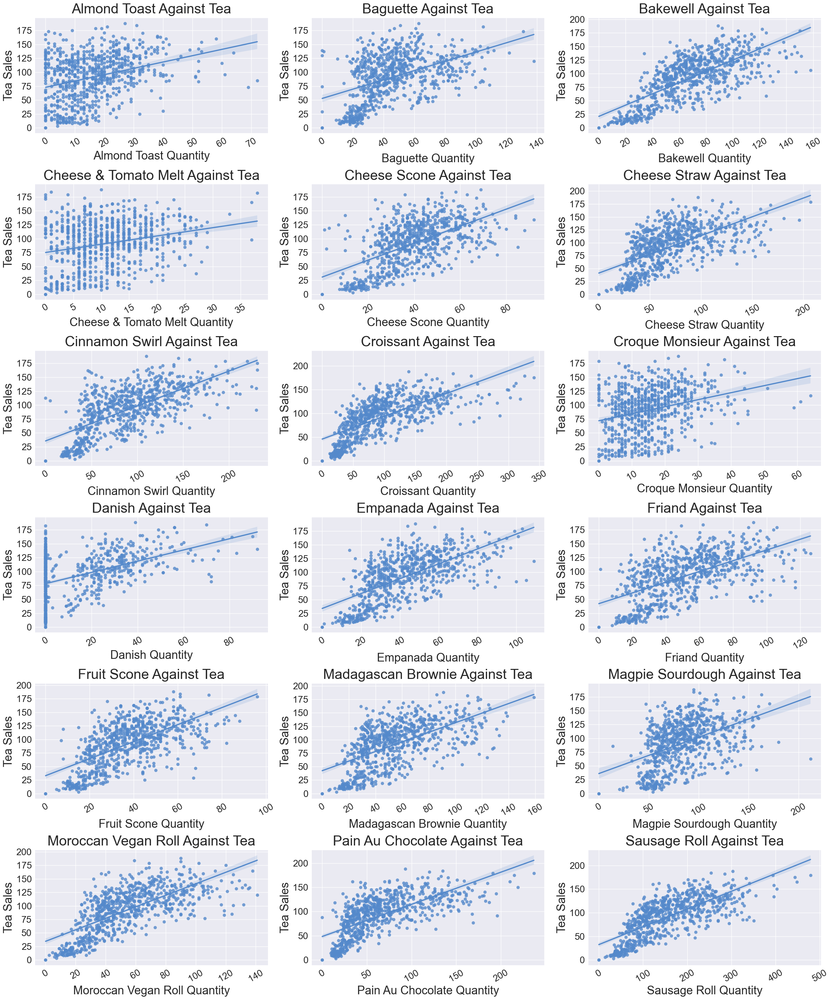

In [107]:
# Loop through product column names against tea 
plt.subplots(6,3, figsize=(25,30))

for i, product in enumerate(product_df_daily.columns.drop(['Coffee', 'Tea'])):
    plt.subplot(6,3,i+1)
    sns.regplot(data = product_df_daily, 
                 x=product_df_daily[product], y=product_df_daily['Tea'], color = bakery.light_magpie)
    plt.ylabel('Tea Sales', fontsize=25)
    plt.yticks(fontsize=20)
    plt.title(f'{product} Against Tea', fontsize=30,pad=10)
    plt.xlabel(f'{product} Quantity', fontsize=25)
    plt.xticks(fontsize=20, rotation=30)
    plt.tight_layout()
    
plt.show()

## Observations of `Tea` Correlation with Other Products
From the above plots, it appears that all the products have a general positive correlation with `Tea` sales. However, not as strong a correlation than that of `Coffee`, suggesting customers may prefer `Coffee` over `Tea`. 

Of these products and regplots: 
- `Sausage Roll`, `Croissant` and `Bakewell` have the greatest correlation with `Tea` sales, suggesting they could be frequently bought together 
- As with `Coffee`, `Danish`, `Cheese & Tomato Melt`, `Croque Monsieur` and `Almond Toast` all appear to have weaker correlations with `Tea` suggesting they are more likely to be bought independently than with a `Tea` or `Coffee`

These correlation and hypotheses provide insight into how customers may behave and which products are frequently bought together or not, which can inform the business on promotions they can create to encourage customer to buy more products and generate greater revenue. This is explored further in the `Market Basket Analysis` notebook. 

# Summary of Analysis

**Part 1 Observations**:
- There's a clear upwards trend in revenue over time
- There is a seasonal pattern to revenue, peaking in the summer months and dipping in the winter. This is most likely due to the location of 3 out of the 4 bakeries sampled being close to the seaside, and people tend to go to the seaside during the summer months 
- These 3 bakeries follow the same revenue trend, whereas the 4th bakery has a slightly different pattern. This is likely due to it being located in a City and therefore the customers have different spending habits
- The top 10 selling products for all the bakeries are Take Out products, and the bottom 10 are seasonal products that were probably on sale for only a few weeks over the 2 years worth of data 

**Part 2 Observations**: 
- There is a strong correlation between `TAVG` and `Revenue`
- `CPI_Electricity` and `CPI_Food` have relatively strong correlations with `Revenue`, however due to the data collection of the CPI data, which is released for each month, 3 weeks after the month, these data points would not be suitable to be included in the modelling as they would only be available for the final week prediction for the daily forecast 
- The type of `Day` had an impact on the `Revene` with `School_Holiday` and `Bank_Holiday` days correlating with higher `Revenue` and `Weekday` corresponding with lower `Revenue`. This is also demonstrated in the correlation heatmap with `Weekday` having a strong negative correlation of -0.5 with `Revenue`. 

**Part 3 Observations**: 
- The majority of the products show the same upward and seasonal trend as the overall revenue and quantity of sales
- `Danish` and `Baguette` products appear to have a less similar pattern. Speaking with owner this is due to them not always being stocked as consistently as the demand is unknown
- All the products follow the same sales pattern as `TAVG` except for `Tea`, `Friands`, `Almond Toast`, `Danish` and `Cheese and Tomato Melt` products. Therefore, for future modelling on product sales, `TAVG` may not be a useful predictor for these products
- Most products correlate more strongly with `Coffee` than `Tea`, which supports the fact that `Coffee` is the top selling product in the bakery
- Further exploration into products bought together will be explored in [Market Basket Analysis](./11_Market_Basket_Analysis.ipynb)

# Next Steps
- Now hypotheses have been developed about the revenue and correlations with external variables, the modelling phase can begin with, with the baseline model of a moving average, found here [Moving Average Model Notebook](./6_Model_1_Moving_Average_Model.ipynb)

>[Return to Contents](#Contents)